In [1]:
import os
import pandas as pd
import math
import keras
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.models import Model, Sequential
from keras.layers import Dense, Dropout,Input, AveragePooling2D, Activation, Flatten
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from keras.callbacks import ReduceLROnPlateau,ModelCheckpoint
from keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import itertools
import seaborn as sns
import time
%matplotlib inline

In [2]:
physical_devices = tf.config.list_physical_devices("GPU")
tf.config.experimental.set_memory_growth(physical_devices[0],True)

In [3]:
mypath= 'dataset/'

In [4]:
filepath="model_cnnnormal/model_cnnnormaltuning.best.hdf5"

In [5]:
file_name = []
tag = []
full_path = []
for path, subdirs, files in os.walk(mypath):
    for name in files:
        full_path.append(os.path.join(path, name)) 
        tag.append(path.split('/')[-1])        
        file_name.append(name)

In [6]:
# memasukan variabel yang sudah dikumpulkan pada looping di atas menjadi sebuah dataframe agar rapih
df = pd.DataFrame({"path":full_path,'file_name':file_name,"tag":tag})
df.groupby(['tag']).size()

tag
test\aksara an            3
test\aksara ang           3
test\aksara ar            3
test\aksara ban           3
test\aksara bang          3
                         ..
validation\aksara we      3
validation\aksara wi      3
validation\aksara yan     3
validation\aksara yang    3
validation\aksara yi      3
Length: 288, dtype: int64

In [7]:
#cek sample datanya
df.head()

,path,file_name,tag
0,dataset/test\aksara an\an_1.png,an_1.png,test\aksara an
1,dataset/test\aksara an\an_2.png,an_2.png,test\aksara an
2,dataset/test\aksara an\an_3.png,an_3.png,test\aksara an
3,dataset/test\aksara ang\ang.png,ang.png,test\aksara ang
4,dataset/test\aksara ang\ang_2.png,ang_2.png,test\aksara ang


In [8]:
#variabel yang digunakan pada pemisahan data ini
X= df['path']
y= df['tag']

In [9]:
# split dataset awal menjadi data train dan test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=300)

In [10]:
# kemudian data test dibagi menjadi 2 sehingga menjadi data test dan data validation.
X_test, X_val, y_test, y_val = train_test_split(
    X_test, y_test, test_size=0.5, random_state=100)

In [11]:
# menyatukan kedalam masing-masing dataframe

df_tr = pd.DataFrame({'path':X_train
              ,'tag':y_train
             ,'set':'train'})

df_te = pd.DataFrame({'path':X_test
              ,'tag':y_test
             ,'set':'test'})

df_val = pd.DataFrame({'path':X_val
              ,'tag':y_val
             ,'set':'validation'})

In [12]:
print('train size', len(df_tr))
print('val size', len(df_te))
print('test size', len(df_val))

train size 1996
val size 250
test size 250


In [13]:
# melihat proporsi pada masing masing set apakah sudah ok atau masih ada yang ingin diubah
df_all = df_tr.append([df_te,df_val]).reset_index(drop=1)\

print('===================================================== \n')
print(df_all.groupby(['set','tag']).size(),'\n')

print('===================================================== \n')

#cek sample datanya
df_all.sample(3)


set         tag                  
test        test\aksara ang          1
            test\aksara can          1
            test\aksara cang         1
            test\aksara ce           2
            test\aksara de           1
                                    ..
validation  validation\aksara pan    2
            validation\aksara re     1
            validation\aksara se     1
            validation\aksara ti     1
            validation\aksara yan    1
Length: 558, dtype: int64 




,path,tag,set
868,dataset/train\aksara cang\cang_14.png,train\aksara cang,train
1728,dataset/test\aksara e\e_3.png,test\aksara e,train
542,dataset/train\aksara tan\tan_7.png,train\aksara tan,train


In [14]:
# Define Input Parameters
dim = (256, 256)
channel = (3,)
input_shape = dim + channel
batch_size = 32

In [15]:
train_datagen = ImageDataGenerator(rescale=1. / 255,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rotation_range=15,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
val_datagen = ImageDataGenerator(rescale=1. / 255,
                                 shear_range=0.2,
                                 zoom_range=0.2,
                                 rotation_range=15,
                                 horizontal_flip=True,
                                 fill_mode='nearest')
test_datagen = ImageDataGenerator(rescale=1. / 255,
                                  shear_range=0.2,
                                  zoom_range=0.2,
                                  rotation_range=15,
                                  horizontal_flip=True,
                                  fill_mode='nearest')

In [16]:
train_generator = train_datagen.flow_from_directory('dataset/train/',
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    shuffle=True)

val_generator = val_datagen.flow_from_directory('dataset/validation/',
                                                batch_size=batch_size,
                                                class_mode='categorical',
                                                shuffle=True)

test_generator = test_datagen.flow_from_directory('dataset/test/',
                                                  batch_size=batch_size,
                                                  class_mode='categorical',
                                                  shuffle=True)

num_class = test_generator.num_classes
labels = train_generator.class_indices.keys()

Found 1920 images belonging to 96 classes.
Found 288 images belonging to 96 classes.
Found 288 images belonging to 96 classes.


In [17]:
print(labels)

dict_keys(['aksara an', 'aksara ang', 'aksara ar', 'aksara ban', 'aksara bang', 'aksara bar', 'aksara be', 'aksara bi', 'aksara can', 'aksara cang', 'aksara car', 'aksara ce', 'aksara ci', 'aksara dan', 'aksara dang', 'aksara dar', 'aksara de', 'aksara de^', 'aksara di', 'aksara e', 'aksara e^', 'aksara gan', 'aksara gang', 'aksara ge', 'aksara ge^', 'aksara ghan', 'aksara ghang', 'aksara ghi', 'aksara gi', 'aksara han', 'aksara hang', 'aksara har', 'aksara he', 'aksara he^', 'aksara hi', 'aksara i', 'aksara jan', 'aksara jang', 'aksara jar', 'aksara je', 'aksara je^', 'aksara ji', 'aksara kan', 'aksara kang', 'aksara kar', 'aksara ke', 'aksara ke^', 'aksara ki', 'aksara lan', 'aksara lang', 'aksara lar', 'aksara le', 'aksara le^', 'aksara li', 'aksara man', 'aksara mang', 'aksara mar', 'aksara me', 'aksara mi', 'aksara nan', 'aksara nang', 'aksara ne', 'aksara ngan', 'aksara ngang', 'aksara ngar', 'aksara nge', 'aksara nge^', 'aksara ngi', 'aksara ni', 'aksara nye', 'aksara nyi', 'aks

In [18]:
def tf_data_generator(generator, input_shape):
    num_class = generator.num_classes
    tf_generator = tf.data.Dataset.from_generator(
        lambda: generator,
        output_types=(tf.float32, tf.float32),
        output_shapes=([None
                        , input_shape[0]
                        , input_shape[1]
                        , input_shape[2]]
                       ,[None, num_class])
    )
    return tf_generator

In [19]:
train_data = tf_data_generator(train_generator, input_shape)
test_data = tf_data_generator(test_generator, input_shape)
val_data = tf_data_generator(val_generator, input_shape)

In [20]:
model = Sequential()
model.add(Conv2D(filters=128, 
                 kernel_size=(11, 11), 
                 strides=(2,2),
                 input_shape=(256,256,3), 
                 activation='relu')) 
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(3, 3),
                       strides=(2, 2))) 

model.add(Conv2D(filters=128, 
                 kernel_size=(5, 5),
                 padding='same',
                 activation='relu')) 
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(3, 3),
                       strides=(2, 2))) 

model.add(Conv2D(filters=256, 
                 kernel_size=(3, 3), 
                 padding='same',
                 activation='relu')) 

model.add(Conv2D(filters=384, 
                 kernel_size=(3, 3), 
                 padding='same',
                 activation='relu')) 
model.add(MaxPooling2D(pool_size=(3, 3),
                       strides=(2, 2)))
model.add(Conv2D(filters=256, 
                 kernel_size=(3, 3), 
                 padding='same',
                 activation='relu')) 
model.add(MaxPooling2D(pool_size=(3, 3),
                       strides=(2, 2))) 

model.add(Flatten()) 

model.add(Dense(1024, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(num_class, activation='softmax'))

In [21]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 123, 123, 128)     46592     
_________________________________________________________________
batch_normalization (BatchNo (None, 123, 123, 128)     512       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 61, 61, 128)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 61, 61, 128)       409728    
_________________________________________________________________
batch_normalization_1 (Batch (None, 61, 61, 128)       512       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 30, 30, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 30, 30, 256)       2

In [22]:
from pathlib import Path
import simplejson
#serialize model to JSON
filepath_json=Path('model_cnnnormal/')
model_json = model.to_json()
with open(filepath_json/"model_cnnnormaltuning.json", "w") as json_file:
    json_file.write(simplejson.dumps(simplejson.loads(model_json), indent=4))

In [23]:
# determine Loss function and Optimizer
model.compile(loss='categorical_crossentropy',
            optimizer=SGD(learning_rate=1e-1,decay=1e-6, momentum=0.9, nesterov=True),
              metrics=['accuracy'])

In [24]:
filepath="model_cnnnormal/model_cnnnormaltuning.best.hdf5"
#callbacks
metrics = 'val_accuracy'
learning_rate_reduction = ReduceLROnPlateau(monitor=metrics, 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.0001)
checkpoint_save = ModelCheckpoint(filepath, monitor=metrics, verbose=1, save_best_only=True, mode='max')

callbacks_list = [checkpoint_save,learning_rate_reduction]

In [25]:
epochs=50
start = time.time()
iterasi1 = model.fit(x=train_data,
                            steps_per_epoch = len(train_generator),
                            epochs=epochs,
                            validation_data=val_data,callbacks=callbacks_list,
                            validation_steps=len(val_generator),
                            shuffle=False,
                            verbose = 1)
print('------------------------------------------------------------------------')
score_training = model.evaluate(train_data,steps=len(test_generator),verbose=0)
print('Test loss:', score_training[0])
print('Test accuracy:', score_training[1])
print('------------------------------------------------------------------------')
score_testing = model.evaluate(test_data,steps=len(test_generator),verbose=0)
print('Test loss:', score_testing[0])
print('Test accuracy:', score_testing[1])
print('------------------------------------------------------------------------')
print("Total time: ", time.time() - start, "seconds")

Epoch 1/50
60/60 [==============================] - 70s 783ms/step - loss: 7.0097 - accuracy: 0.0377 - val_loss: 282.4584 - val_accuracy: 0.0104

Epoch 00001: val_accuracy improved from -inf to 0.01042, saving model to model_cnnnormal\model_cnnnormaltuning.best.hdf5
Epoch 2/50
60/60 [==============================] - 45s 747ms/step - loss: 4.4193 - accuracy: 0.0899 - val_loss: 14.3551 - val_accuracy: 0.0104

Epoch 00002: val_accuracy did not improve from 0.01042
Epoch 3/50
60/60 [==============================] - 44s 742ms/step - loss: 3.3335 - accuracy: 0.1369 - val_loss: 5.2352 - val_accuracy: 0.0278

Epoch 00003: val_accuracy improved from 0.01042 to 0.02778, saving model to model_cnnnormal\model_cnnnormaltuning.best.hdf5
Epoch 4/50
60/60 [==============================] - 44s 733ms/step - loss: 2.9567 - accuracy: 0.2038 - val_loss: 3.8208 - val_accuracy: 0.0833

Epoch 00004: val_accuracy improved from 0.02778 to 0.08333, saving model to model_cnnnormal\model_cnnnormaltuning.best.hd

60/60 [==============================] - 47s 784ms/step - loss: 0.6342 - accuracy: 0.7649 - val_loss: 0.4451 - val_accuracy: 0.8646

Epoch 00035: val_accuracy improved from 0.80903 to 0.86458, saving model to model_cnnnormal\model_cnnnormaltuning.best.hdf5
Epoch 36/50
60/60 [==============================] - 47s 788ms/step - loss: 0.6609 - accuracy: 0.7431 - val_loss: 0.4189 - val_accuracy: 0.8681

Epoch 00036: val_accuracy improved from 0.86458 to 0.86806, saving model to model_cnnnormal\model_cnnnormaltuning.best.hdf5
Epoch 37/50
60/60 [==============================] - 47s 785ms/step - loss: 0.6473 - accuracy: 0.7723 - val_loss: 0.5097 - val_accuracy: 0.8681

Epoch 00037: val_accuracy did not improve from 0.86806
Epoch 38/50
60/60 [==============================] - 47s 779ms/step - loss: 0.6180 - accuracy: 0.7703 - val_loss: 0.4057 - val_accuracy: 0.8958

Epoch 00038: val_accuracy improved from 0.86806 to 0.89583, saving model to model_cnnnormal\model_cnnnormaltuning.best.hdf5
Epoch

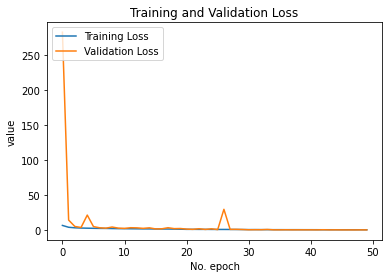

In [26]:
plt.plot(iterasi1.history['loss'], label='Training Loss')
plt.plot(iterasi1.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.ylabel('value')
plt.xlabel('No. epoch')
plt.legend(loc="upper left")
plt.show()

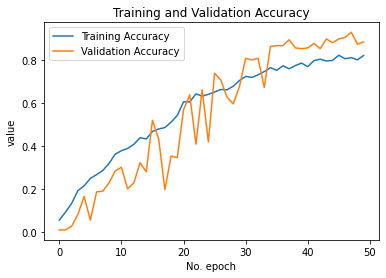

In [27]:
plt.plot(iterasi1.history['accuracy'], label='Training Accuracy')
plt.plot(iterasi1.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.ylabel('value')
plt.xlabel('No. epoch')
plt.legend(loc="upper left")
plt.show()

In [28]:
test_data_generator = test_datagen.flow_from_directory(
    'dataset/test/', # Put your path here
     target_size=(256, 256),
    batch_size=32,
    shuffle=False)
test_steps_per_epoch = np.math.ceil(test_data_generator.samples / test_data_generator.batch_size)

predictions = model.predict(test_data_generator, steps=test_steps_per_epoch)
# Get most likely class
predicted_classes = np.argmax(predictions, axis=1)

Found 288 images belonging to 96 classes.


In [29]:
true_classes = test_data_generator.classes
class_labels = list(test_data_generator.class_indices.keys())  

In [30]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix', 
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    sns.set(font_scale=25.0)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

confusion_mtx = confusion_matrix(true_classes, predicted_classes) 
plt.figure(figsize=(350,350))
# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(96))
plt.savefig('normal anak atas.jpg')

In [31]:
from sklearn.metrics import classification_report
report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)

              precision    recall  f1-score   support

   aksara an       0.67      0.67      0.67         3
  aksara ang       1.00      1.00      1.00         3
   aksara ar       1.00      1.00      1.00         3
  aksara ban       1.00      1.00      1.00         3
 aksara bang       1.00      1.00      1.00         3
  aksara bar       1.00      1.00      1.00         3
   aksara be       1.00      1.00      1.00         3
   aksara bi       1.00      1.00      1.00         3
  aksara can       1.00      1.00      1.00         3
 aksara cang       1.00      1.00      1.00         3
  aksara car       1.00      1.00      1.00         3
   aksara ce       1.00      1.00      1.00         3
   aksara ci       1.00      1.00      1.00         3
  aksara dan       0.75      1.00      0.86         3
 aksara dang       1.00      0.67      0.80         3
  aksara dar       1.00      1.00      1.00         3
   aksara de       1.00      1.00      1.00         3
  aksara de^       0.75    

In [33]:
MODEL_BASE_PATH = "model_cnnnormal"
PROJECT_NAME = "pengenalan"
SAVE_MODEL_NAME = "model_cnnnormaltuning.h5"
save_model_path = os.path.join(MODEL_BASE_PATH, PROJECT_NAME, SAVE_MODEL_NAME)

if os.path.exists(os.path.join(MODEL_BASE_PATH, PROJECT_NAME)) == False:
    os.makedirs(os.path.join(MODEL_BASE_PATH, PROJECT_NAME))
    
print('Saving Model At {}...'.format(save_model_path))
model.save(save_model_path,include_optimizer=False)

Saving Model At model_cnnnormal\pengenalan\model_cnnnormaltuning.h5...
